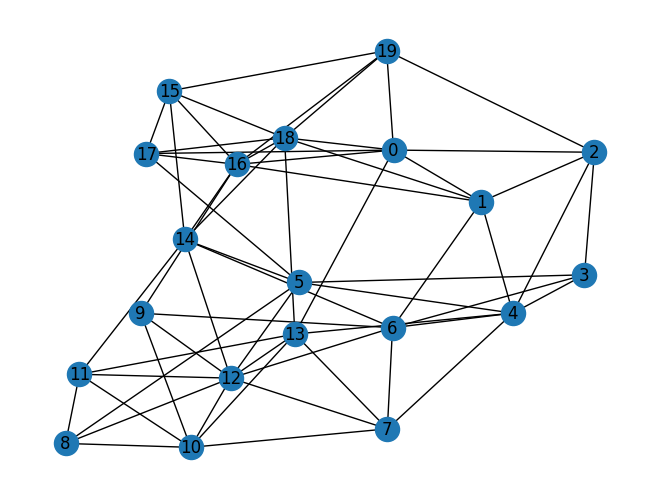

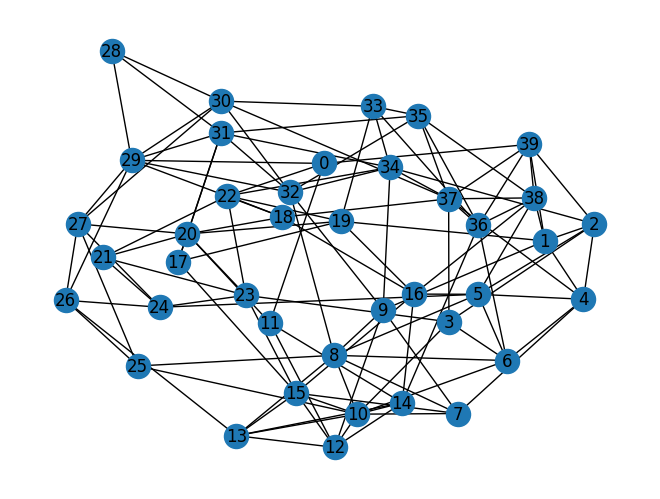

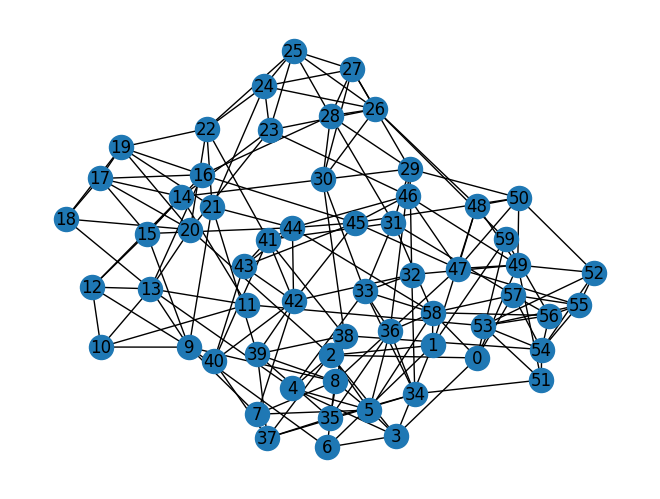

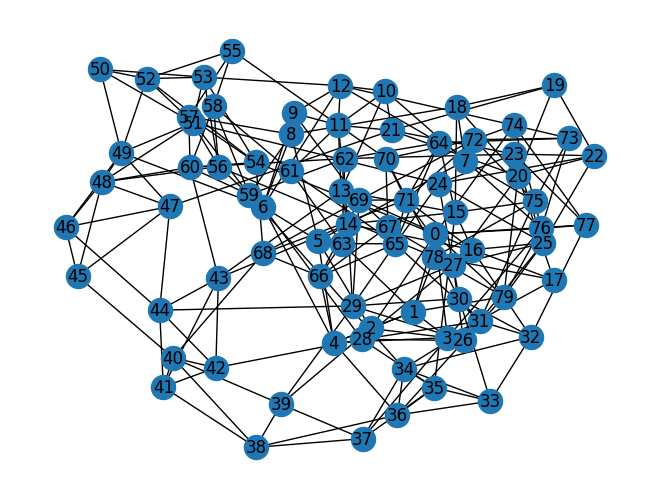

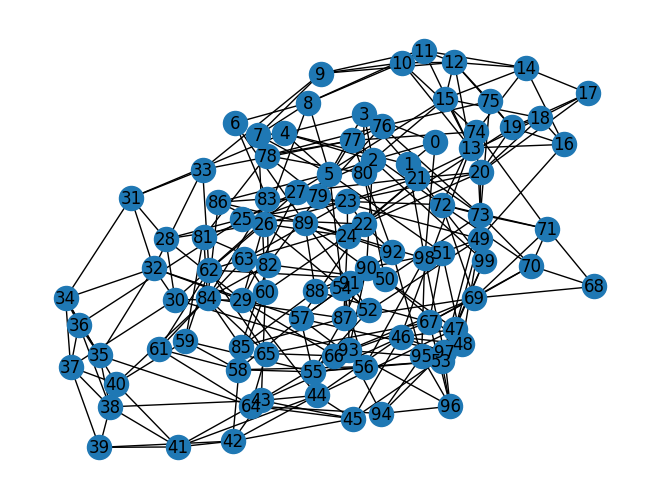

...

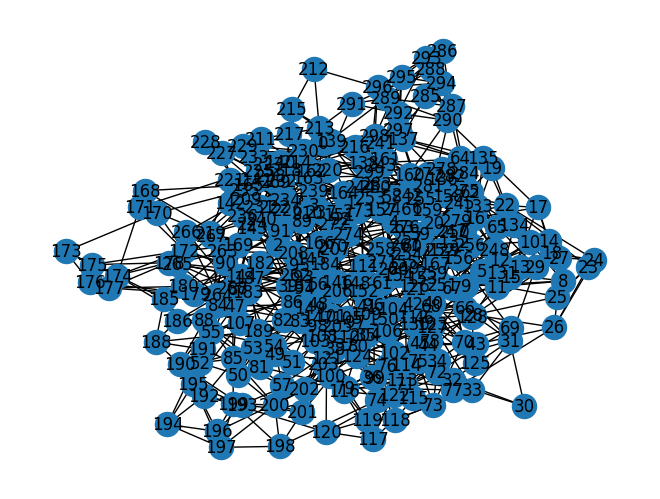

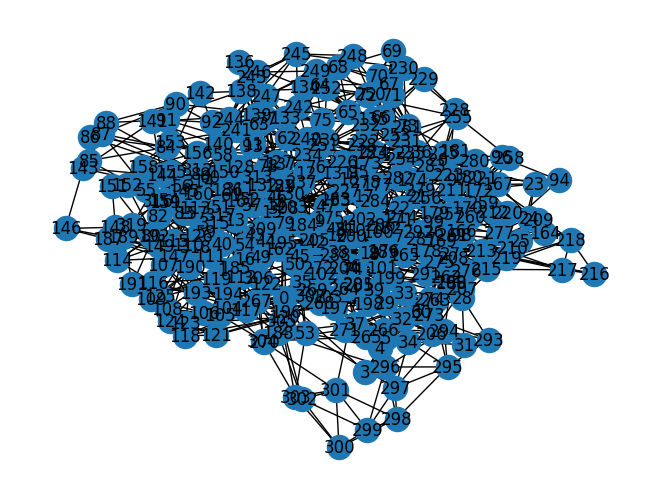

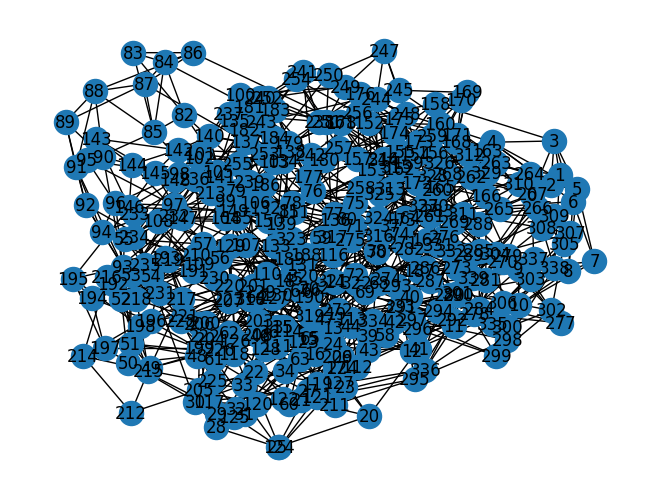

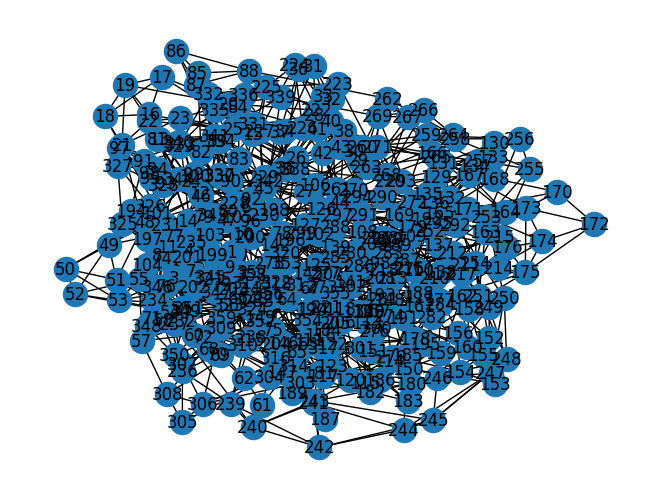

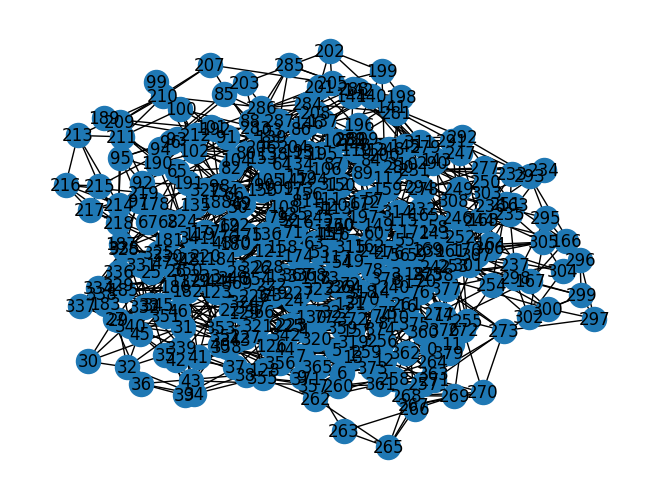

In [ ]:
!pip install networkx
import time
import networkx as nx
import random
import pandas as pd
import ast
import matplotlib.pyplot as plt

#creating data files - graph data -
#to avoid different data each time
for i in range (20, 400, 20):
    n = i
    k =7 # Desired average degree of the nodes
    p = 0.3  # Probability of rewiring in the Watts-Strogatz model

    G = nx.connected_watts_strogatz_graph(n,k,p)

    # Assign random weights to edges
    for u, v in G.edges():
        weight = random.randint(25, 50)  # Generate a random weight between 1 and 100
        G[u][v]['weight'] = weight

    nx.draw(G, with_labels=True)
    plt.show()

    # Convert the graph to a pandas DataFrame
    df = pd.DataFrame(G.edges(data=True), columns=['Source', 'Target', 'Weight'])
    # Save the DataFrame to a CSV file
    filename = "graph_data_with_weights" + str(i) + ".csv"
    df.to_csv(filename, index=False)

In [ ]:
import heapq
import networkx as nx

def prims(graph):
    # Get the number of vertices in the graph
    V = len(graph.nodes())
    # Create an adjacency list representation of the graph
    adj = [[] for _ in range(V)]

    # Fill the adjacency list with edges and their weights
    for u, v, wt in graph.edges(data='weight', default=1):
        adj[u].append((v, wt))
        adj[v].append((u, wt))

    # Create a priority queue to store edges with their weights
    pq = []
    # Create a visited array to keep track of visited vertices
    visited = [False] * V
    # Variable to store the result (minimum spanning tree)
    mst = nx.Graph()
    # Start with vertex 0
    heapq.heappush(pq, (0, 0, -1))  # The third element is the parent node (-1 for the root)

    # Perform Prim's algorithm to find the Minimum Spanning Tree
    while pq:
        wt, u, parent = heapq.heappop(pq)
        if visited[u]:
            continue  # Skip if the vertex is already visited
        visited[u] = True  # Mark the vertex as visited
        if parent != -1:
            mst.add_edge(parent, u, weight=wt)  # Add the edge to the MST
        # Explore the adjacent vertices
        for v, weight in adj[u]:
            if not visited[v]:
                heapq.heappush(pq, (weight, v, u))  # Add the adjacent edge to the priority queue

    # Return the Minimum Spanning Tree
    return mst

def kruskal_mst(graph):
    # Sort edges by weight
    edges = sorted(graph.edges(data=True), key=lambda x: x[2]['weight'])

    # Initialize disjoint set data structure
    disjoint_set = {node: node for node in graph.nodes()}

    # Initialize minimum spanning tree graph
    mst = nx.Graph()

    for edge in edges:
        u, v, data = edge
        root_u = find(disjoint_set, u)
        root_v = find(disjoint_set, v)

        if root_u != root_v:
            # Add edge to MST
            mst.add_edge(u, v, weight=data['weight'])

            # Merge the two disjoint sets
            disjoint_set[root_u] = root_v

    return mst

def find(disjoint_set, node):
    if disjoint_set[node] != node:
        disjoint_set[node] = find(disjoint_set, disjoint_set[node])
    return disjoint_set[node]


Nodes of the graph dataset: [0, 1, 19, 2, 18, 17, 13, 16, 4, 6, 3, 5, 7, 8, 14, 12, 9, 10, 11, 15]
Edges of the read graph: [(0, 1, {'weight': 42}), (0, 19, {'weight': 28}), (0, 2, {'weight': 42}), (0, 18, {'weight': 29}), (0, 17, {'weight': 27}), (0, 13, {'weight': 28}), (0, 16, {'weight': 50}), (1, 4, {'weight': 37}), (1, 18, {'weight': 29}), (1, 6, {'weight': 28}), (1, 16, {'weight': 30}), (1, 2, {'weight': 30}), (19, 2, {'weight': 32}), (19, 15, {'weight': 32}), (19, 16, {'weight': 27}), (19, 18, {'weight': 32}), (2, 3, {'weight': 33}), (2, 4, {'weight': 26}), (18, 13, {'weight': 25}), (18, 14, {'weight': 47}), (18, 15, {'weight': 49}), (18, 16, {'weight': 46}), (18, 17, {'weight': 43}), (17, 5, {'weight': 48}), (17, 15, {'weight': 47}), (17, 16, {'weight': 45}), (13, 4, {'weight': 42}), (13, 7, {'weight': 45}), (13, 10, {'weight': 44}), (13, 11, {'weight': 48}), (13, 12, {'weight': 41}), (16, 9, {'weight': 39}), (16, 14, {'weight': 38}), (16, 15, {'weight': 49}), (4, 3, {'weight':

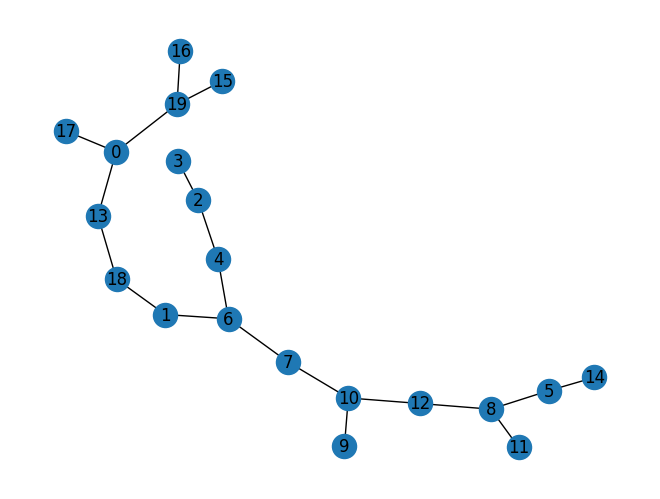

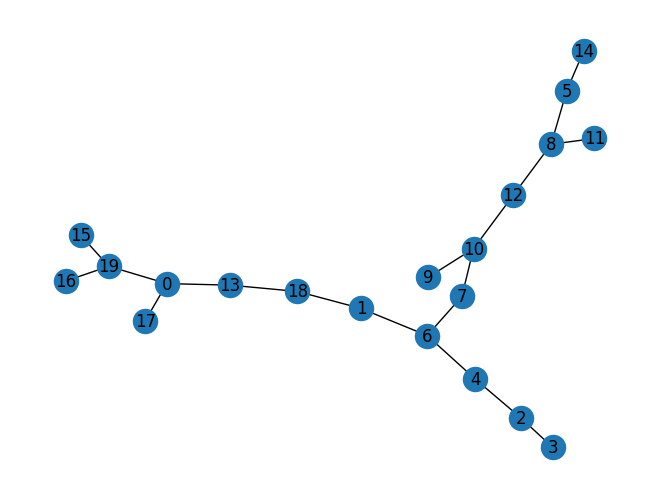

Nodes of the graph dataset: [0, 39, 29, 11, 22, 1, 2, 4, 38, 9, 19, 3, 5, 34, 6, 10, 37, 23, 7, 8, 24, 16, 36, 15, 32, 25, 13, 12, 14, 20, 26, 17, 18, 31, 33, 21, 27, 30, 28, 35]
Edges of the read graph: [(0, 39, {'weight': 46}), (0, 29, {'weight': 26}), (0, 11, {'weight': 40}), (0, 22, {'weight': 48}), (39, 1, {'weight': 36}), (39, 2, {'weight': 48}), (39, 36, {'weight': 28}), (39, 37, {'weight': 27}), (39, 38, {'weight': 40}), (29, 18, {'weight': 28}), (29, 26, {'weight': 50}), (29, 27, {'weight': 50}), (29, 28, {'weight': 38}), (29, 30, {'weight': 28}), (29, 31, {'weight': 30}), (29, 32, {'weight': 46}), (11, 12, {'weight': 26}), (11, 14, {'weight': 25}), (11, 20, {'weight': 49}), (22, 18, {'weight': 40}), (22, 19, {'weight': 38}), (22, 21, {'weight': 48}), (22, 23, {'weight': 45}), (22, 34, {'weight': 35}), (1, 2, {'weight': 36}), (1, 4, {'weight': 35}), (1, 38, {'weight': 43}), (1, 9, {'weight': 33}), (1, 19, {'weight': 33}), (2, 3, {'weight': 27}), (2, 4, {'weight': 37}), (2, 5, 

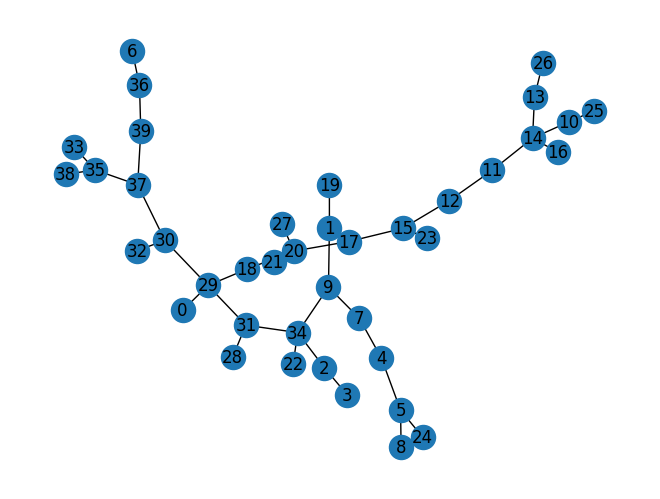

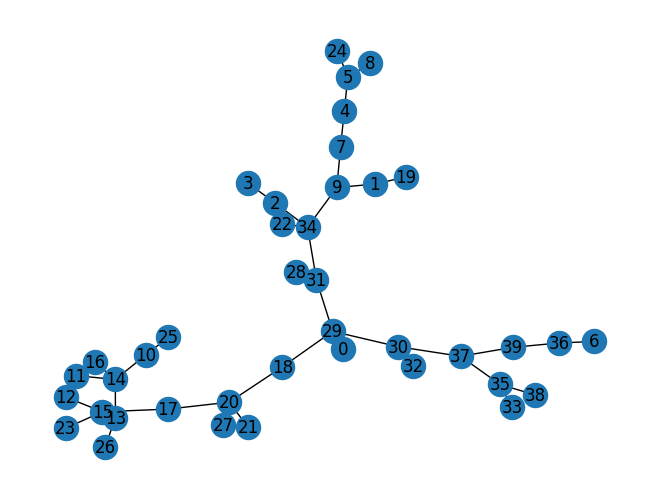

Nodes of the graph dataset: [0, 59, 2, 58, 3, 57, 49, 1, 6, 48, 4, 5, 20, 33, 13, 7, 8, 36, 9, 42, 47, 39, 10, 12, 21, 15, 11, 14, 53, 16, 18, 17, 30, 23, 44, 19, 28, 45, 22, 24, 25, 41, 26, 46, 27, 29, 31, 32, 50, 38, 34, 35, 37, 51, 40, 54, 43, 55, 52, 56]
Edges of the read graph: [(0, 59, {'weight': 34}), (0, 2, {'weight': 38}), (0, 58, {'weight': 33}), (0, 3, {'weight': 39}), (0, 57, {'weight': 48}), (0, 49, {'weight': 28}), (59, 1, {'weight': 25}), (59, 26, {'weight': 26}), (59, 56, {'weight': 29}), (2, 1, {'weight': 29}), (2, 3, {'weight': 49}), (2, 4, {'weight': 37}), (2, 5, {'weight': 41}), (2, 20, {'weight': 49}), (58, 1, {'weight': 32}), (58, 5, {'weight': 48}), (58, 31, {'weight': 44}), (58, 33, {'weight': 50}), (58, 36, {'weight': 37}), (58, 44, {'weight': 25}), (58, 56, {'weight': 50}), (58, 57, {'weight': 41}), (3, 1, {'weight': 26}), (3, 4, {'weight': 35}), (3, 5, {'weight': 50}), (3, 6, {'weight': 49}), (57, 31, {'weight': 45}), (57, 54, {'weight': 34}), (57, 55, {'weig

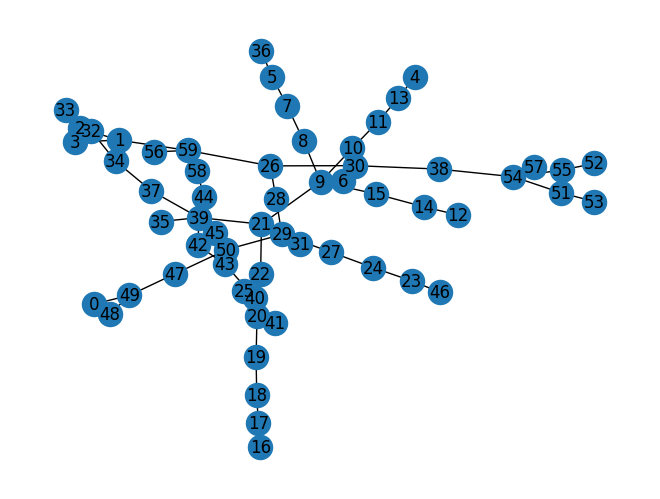

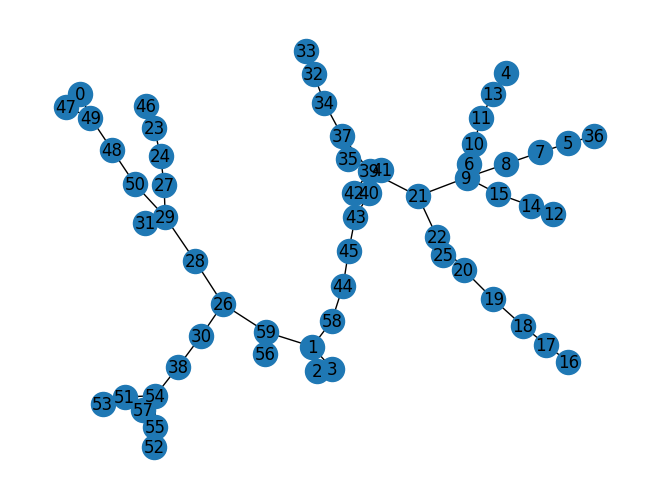

Nodes of the graph dataset: [0, 1, 79, 2, 3, 77, 54, 74, 76, 4, 78, 63, 5, 39, 17, 31, 37, 6, 66, 36, 7, 8, 9, 49, 28, 12, 10, 75, 18, 57, 59, 11, 69, 13, 21, 14, 61, 64, 53, 15, 16, 43, 29, 35, 25, 71, 32, 20, 19, 22, 27, 23, 47, 24, 62, 65, 51, 26, 30, 67, 42, 44, 33, 70, 34, 38, 40, 41, 68, 45, 60, 46, 48, 56, 50, 52, 55, 58, 73, 72]
Edges of the read graph: [(0, 1, {'weight': 46}), (0, 79, {'weight': 26}), (0, 2, {'weight': 36}), (0, 3, {'weight': 31}), (0, 77, {'weight': 32}), (0, 54, {'weight': 46}), (0, 74, {'weight': 26}), (0, 76, {'weight': 38}), (1, 2, {'weight': 29}), (1, 3, {'weight': 35}), (1, 79, {'weight': 40}), (1, 4, {'weight': 48}), (1, 78, {'weight': 42}), (1, 63, {'weight': 46}), (79, 20, {'weight': 26}), (79, 25, {'weight': 48}), (79, 36, {'weight': 27}), (79, 76, {'weight': 33}), (79, 78, {'weight': 49}), (2, 3, {'weight': 48}), (2, 4, {'weight': 46}), (2, 5, {'weight': 44}), (2, 39, {'weight': 26}), (3, 4, {'weight': 30}), (3, 76, {'weight': 28}), (3, 17, {'weigh

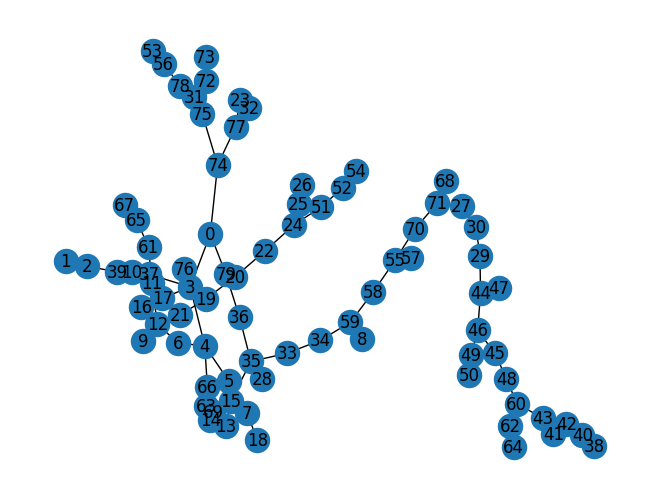

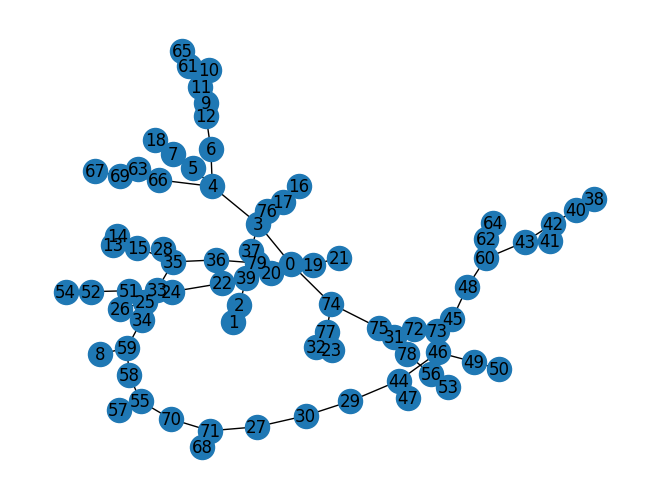

Nodes of the graph dataset: [0, 1, 2, 98, 3, 99, 4, 73, 5, 25, 15, 90, 80, 7, 31, 8, 54, 86, 51, 6, 89, 83, 9, 60, 10, 11, 26, 12, 33, 13, 74, 14, 19, 75, 16, 46, 17, 18, 27, 49, 20, 21, 22, 23, 24, 57, 92, 63, 87, 79, 28, 36, 29, 52, 62, 30, 32, 44, 66, 37, 93, 34, 35, 77, 40, 38, 64, 39, 41, 43, 42, 59, 84, 45, 85, 47, 48, 97, 50, 82, 67, 55, 91, 53, 56, 96, 58, 61, 81, 65, 94, 69, 70, 88, 68, 71, 72, 76, 78, 95]
Edges of the read graph: [(0, 1, {'weight': 35}), (0, 2, {'weight': 32}), (0, 98, {'weight': 34}), (0, 3, {'weight': 33}), (1, 3, {'weight': 46}), (1, 99, {'weight': 32}), (1, 4, {'weight': 47}), (1, 98, {'weight': 34}), (1, 73, {'weight': 38}), (2, 4, {'weight': 47}), (2, 5, {'weight': 47}), (2, 99, {'weight': 28}), (2, 25, {'weight': 29}), (2, 15, {'weight': 42}), (2, 90, {'weight': 27}), (2, 3, {'weight': 32}), (2, 80, {'weight': 47}), (98, 56, {'weight': 28}), (98, 89, {'weight': 33}), (98, 95, {'weight': 28}), (98, 97, {'weight': 34}), (3, 4, {'weight': 50}), (3, 5, {'w

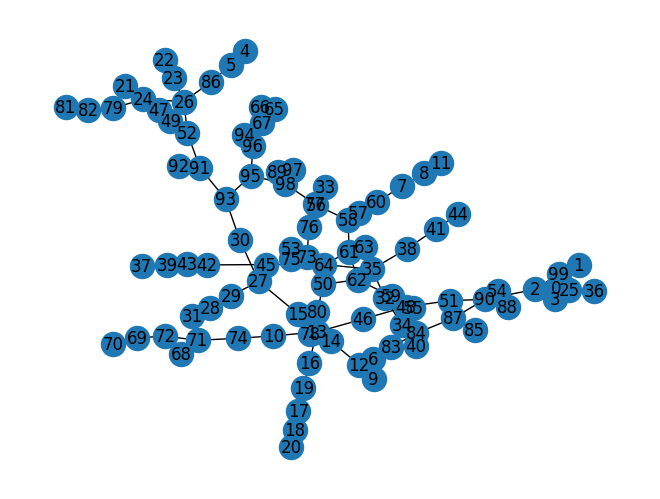

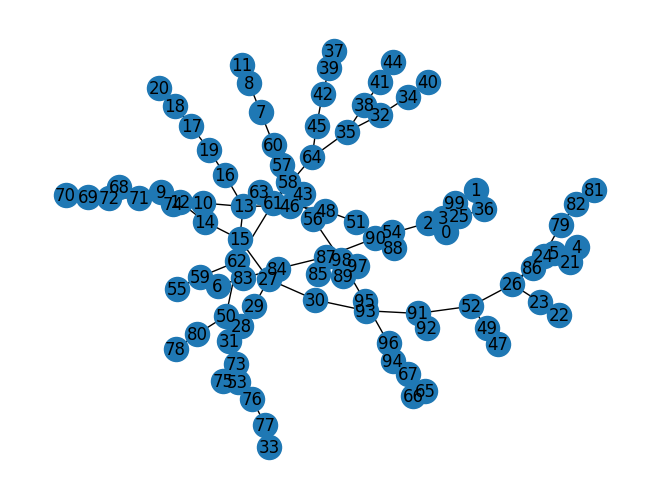

Nodes of the graph dataset: [0, 1, 118, 3, 117, 89, 77, 43, 4, 68, 98, 2, 5, 119, 17, 19, 21, 6, 34, 108, 7, 8, 45, 82, 12, 9, 10, 74, 102, 76, 11, 54, 13, 59, 65, 50, 25, 15, 14, 32, 96, 16, 112, 110, 91, 18, 51, 93, 20, 64, 29, 73, 101, 38, 22, 23, 40, 88, 24, 56, 31, 26, 27, 103, 28, 35, 79, 41, 30, 42, 33, 48, 115, 62, 92, 71, 61, 36, 37, 39, 49, 81, 90, 106, 83, 67, 44, 100, 46, 60, 47, 66, 52, 105, 53, 99, 55, 57, 58, 69, 63, 114, 70, 87, 72, 75, 109, 78, 80, 113, 84, 111, 85, 86, 94, 95, 97, 104, 107, 116]
Edges of the read graph: [(0, 1, {'weight': 34}), (0, 118, {'weight': 25}), (0, 3, {'weight': 44}), (0, 117, {'weight': 42}), (0, 89, {'weight': 41}), (0, 77, {'weight': 48}), (0, 43, {'weight': 40}), (1, 3, {'weight': 49}), (1, 4, {'weight': 37}), (1, 118, {'weight': 30}), (1, 68, {'weight': 31}), (1, 98, {'weight': 42}), (118, 70, {'weight': 28}), (118, 75, {'weight': 28}), (118, 115, {'weight': 47}), (118, 116, {'weight': 42}), (118, 117, {'weight': 34}), (118, 119, {'weigh

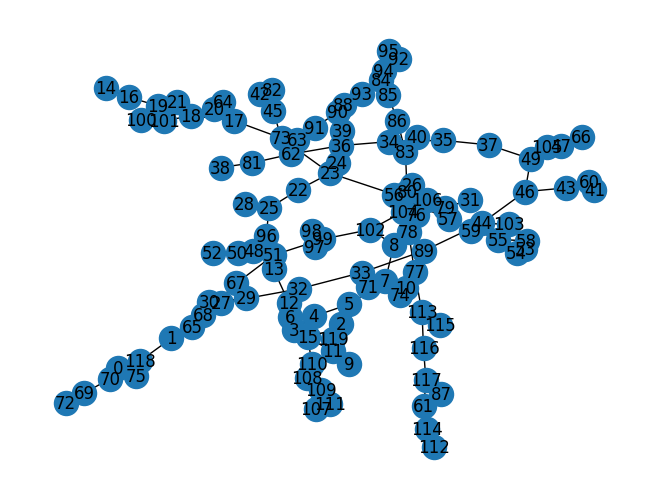

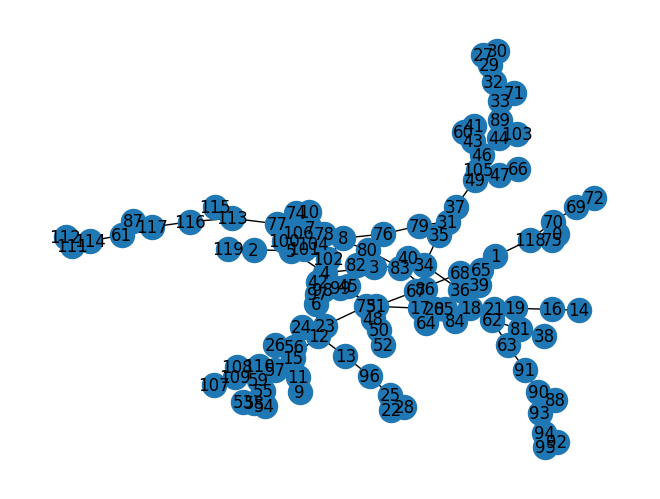

Nodes of the graph dataset: [0, 1, 139, 2, 138, 3, 90, 46, 4, 50, 89, 132, 5, 75, 27, 55, 6, 113, 7, 134, 62, 8, 9, 10, 11, 117, 12, 119, 13, 14, 133, 15, 122, 16, 97, 94, 17, 18, 83, 103, 124, 137, 92, 66, 19, 20, 44, 123, 26, 21, 22, 23, 135, 24, 65, 25, 82, 87, 28, 49, 29, 30, 79, 95, 37, 31, 69, 76, 51, 53, 105, 32, 33, 34, 54, 35, 85, 36, 60, 107, 93, 71, 38, 63, 121, 39, 40, 67, 101, 41, 125, 129, 42, 43, 127, 86, 91, 45, 104, 47, 48, 102, 52, 56, 57, 72, 58, 59, 61, 108, 64, 118, 68, 70, 84, 116, 114, 112, 73, 100, 74, 88, 77, 78, 80, 81, 111, 98, 109, 96, 128, 99, 130, 106, 110, 115, 120, 126, 131, 136]
Edges of the read graph: [(0, 1, {'weight': 35}), (0, 139, {'weight': 33}), (0, 2, {'weight': 33}), (0, 138, {'weight': 44}), (0, 3, {'weight': 32}), (0, 90, {'weight': 28}), (0, 46, {'weight': 43}), (1, 2, {'weight': 47}), (1, 139, {'weight': 46}), (1, 4, {'weight': 35}), (1, 138, {'weight': 31}), (1, 50, {'weight': 45}), (1, 89, {'weight': 46}), (1, 132, {'weight': 47}), (139,

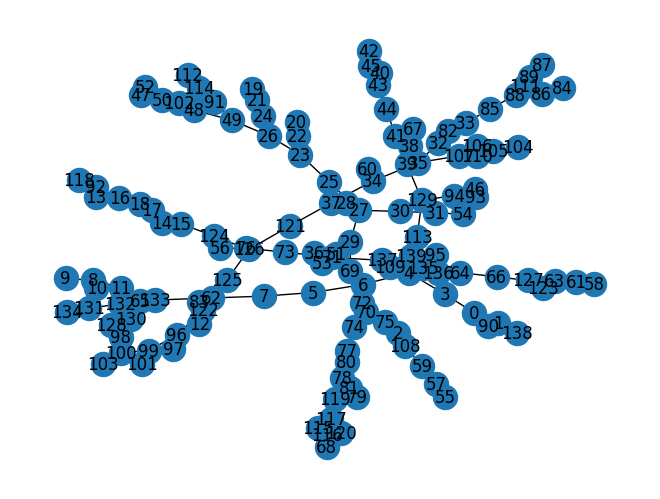

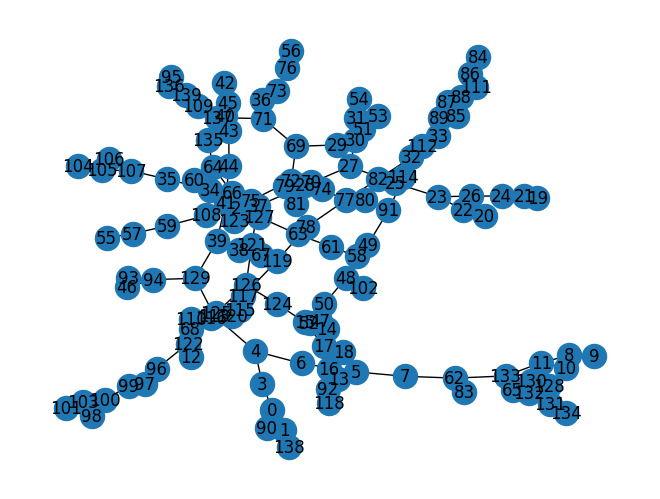

Nodes of the graph dataset: [0, 159, 2, 158, 133, 129, 100, 1, 3, 4, 20, 64, 5, 59, 135, 6, 148, 139, 140, 68, 7, 91, 80, 66, 8, 9, 142, 18, 128, 10, 101, 11, 12, 17, 130, 79, 134, 23, 13, 14, 105, 74, 15, 32, 88, 16, 98, 19, 44, 63, 45, 57, 153, 151, 115, 132, 108, 21, 70, 65, 95, 24, 157, 22, 83, 25, 26, 35, 27, 28, 29, 48, 31, 30, 121, 33, 84, 118, 67, 34, 36, 37, 144, 87, 97, 38, 39, 40, 149, 61, 53, 85, 96, 41, 42, 43, 141, 75, 71, 127, 46, 47, 102, 49, 120, 50, 51, 107, 52, 152, 55, 110, 54, 143, 56, 103, 117, 93, 58, 76, 60, 125, 62, 145, 122, 119, 124, 138, 69, 72, 73, 104, 78, 92, 77, 111, 81, 82, 112, 86, 136, 89, 109, 147, 116, 90, 94, 99, 106, 113, 114, 123, 126, 154, 150, 131, 155, 137, 146, 156]
Edges of the read graph: [(0, 159, {'weight': 41}), (0, 2, {'weight': 38}), (0, 158, {'weight': 45}), (0, 133, {'weight': 29}), (0, 129, {'weight': 27}), (0, 100, {'weight': 50}), (159, 1, {'weight': 35}), (159, 2, {'weight': 32}), (159, 156, {'weight': 25}), (159, 157, {'weight':

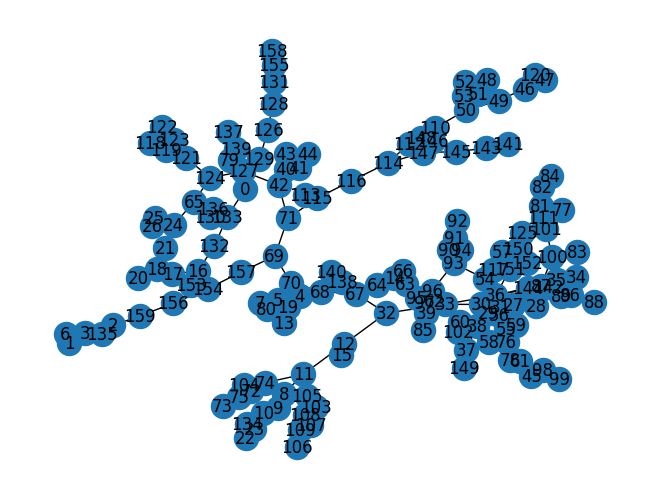

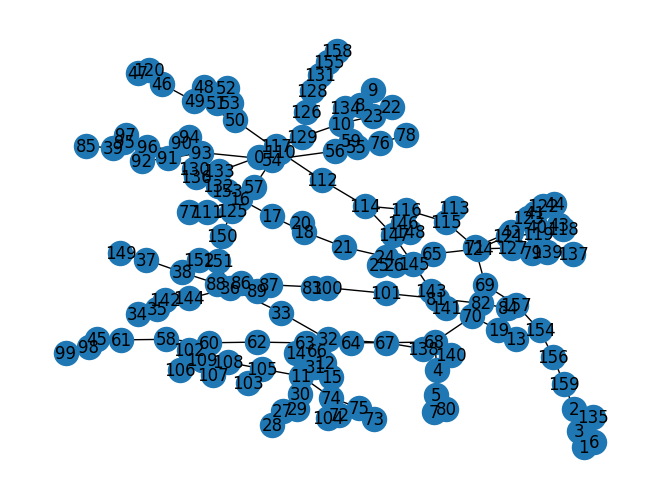

Nodes of the graph dataset: [0, 179, 178, 3, 93, 53, 156, 142, 1, 2, 4, 111, 51, 6, 60, 5, 7, 77, 25, 18, 36, 31, 9, 113, 8, 10, 114, 11, 12, 84, 165, 14, 27, 15, 82, 13, 100, 72, 90, 16, 17, 66, 131, 97, 19, 103, 20, 172, 21, 22, 23, 107, 24, 75, 26, 98, 28, 29, 39, 30, 59, 123, 32, 70, 33, 35, 132, 68, 34, 145, 46, 159, 157, 37, 38, 40, 115, 41, 133, 89, 71, 85, 154, 124, 94, 42, 43, 44, 45, 118, 48, 134, 108, 116, 47, 96, 87, 49, 54, 105, 73, 50, 106, 52, 110, 55, 129, 173, 56, 57, 91, 162, 58, 120, 158, 61, 121, 176, 63, 150, 161, 62, 64, 65, 67, 125, 69, 169, 74, 76, 127, 78, 104, 79, 99, 80, 81, 147, 152, 175, 83, 86, 88, 122, 139, 92, 126, 95, 117, 101, 102, 148, 109, 112, 119, 174, 177, 144, 128, 130, 170, 140, 149, 135, 136, 160, 137, 138, 141, 143, 171, 146, 151, 166, 153, 155, 163, 164, 167, 168]
Edges of the read graph: [(0, 179, {'weight': 40}), (0, 178, {'weight': 44}), (0, 3, {'weight': 34}), (0, 93, {'weight': 35}), (0, 53, {'weight': 45}), (0, 156, {'weight': 44}), (0,

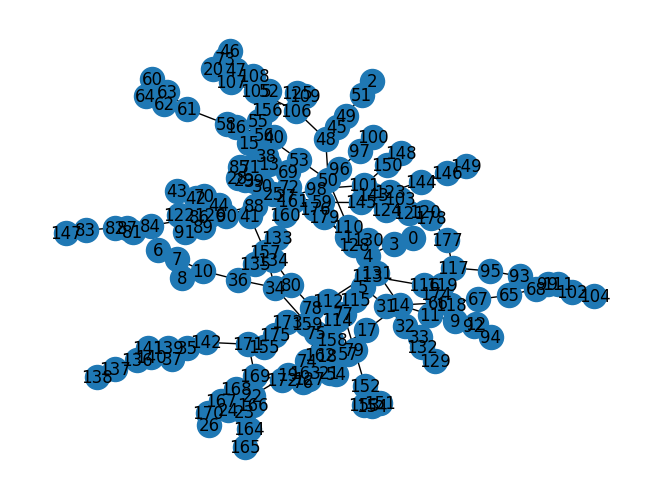

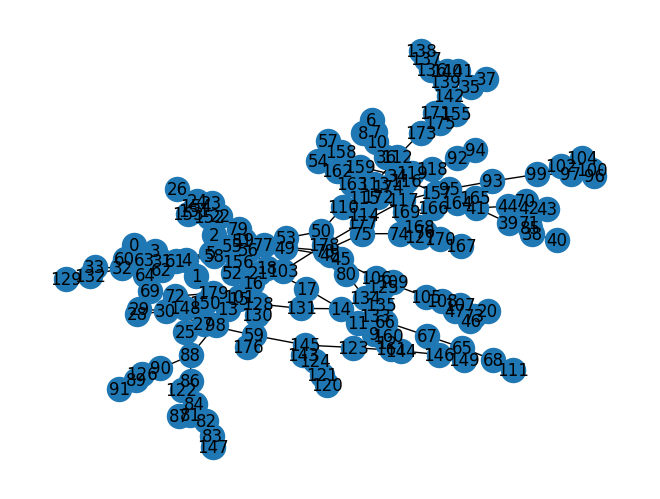

Nodes of the graph dataset: [0, 1, 2, 3, 197, 145, 198, 106, 187, 4, 5, 199, 6, 123, 130, 20, 37, 88, 7, 8, 9, 185, 61, 10, 180, 174, 100, 12, 121, 40, 11, 13, 14, 118, 126, 141, 15, 16, 17, 153, 18, 44, 19, 146, 186, 43, 26, 21, 22, 24, 114, 23, 161, 148, 25, 178, 69, 163, 83, 132, 79, 138, 54, 27, 28, 102, 29, 30, 133, 31, 136, 65, 32, 33, 34, 115, 78, 95, 46, 35, 36, 87, 81, 38, 86, 39, 181, 173, 41, 93, 42, 98, 196, 73, 71, 143, 96, 45, 156, 117, 58, 47, 101, 48, 49, 50, 51, 52, 140, 55, 53, 182, 56, 57, 116, 59, 179, 109, 74, 60, 68, 62, 63, 70, 120, 113, 103, 64, 66, 111, 67, 164, 119, 89, 76, 154, 72, 107, 134, 75, 139, 77, 99, 172, 127, 80, 91, 82, 168, 84, 85, 149, 160, 90, 190, 92, 94, 135, 131, 97, 188, 150, 191, 104, 105, 166, 108, 167, 124, 110, 112, 183, 176, 128, 155, 144, 151, 195, 122, 125, 170, 129, 177, 137, 193, 159, 142, 147, 152, 184, 157, 158, 162, 165, 169, 171, 175, 189, 192, 194]
Edges of the read graph: [(0, 1, {'weight': 37}), (0, 2, {'weight': 43}), (0, 3, 

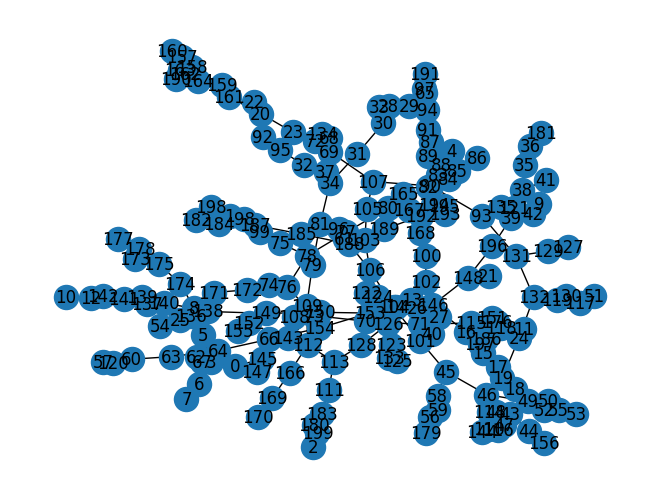

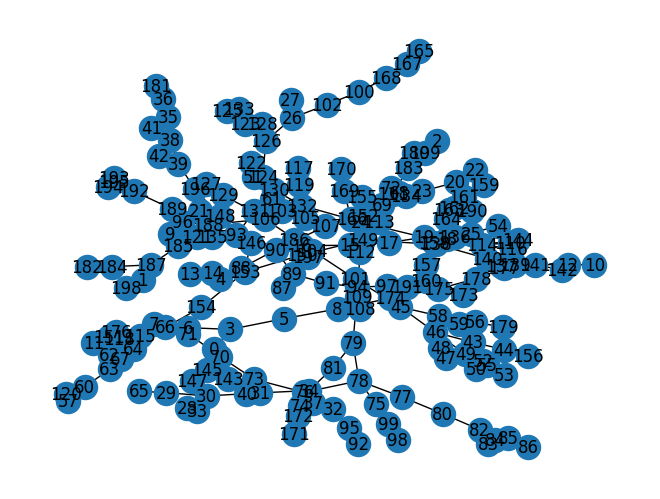

Nodes of the graph dataset: [0, 1, 219, 2, 218, 3, 4, 139, 136, 175, 5, 6, 44, 51, 7, 62, 8, 99, 9, 10, 180, 11, 83, 58, 102, 200, 12, 13, 186, 20, 14, 40, 15, 178, 123, 16, 169, 214, 137, 105, 17, 125, 18, 19, 91, 173, 109, 113, 86, 21, 22, 190, 46, 94, 23, 133, 79, 54, 146, 24, 25, 26, 147, 27, 90, 28, 29, 107, 30, 61, 149, 31, 37, 115, 118, 32, 213, 202, 33, 34, 168, 35, 36, 104, 66, 103, 39, 38, 41, 185, 55, 42, 43, 150, 176, 108, 183, 163, 196, 45, 126, 48, 124, 192, 47, 49, 50, 95, 71, 52, 142, 101, 53, 153, 194, 56, 57, 155, 59, 84, 60, 217, 207, 93, 63, 67, 141, 64, 179, 65, 119, 68, 76, 70, 75, 69, 72, 73, 74, 106, 116, 130, 77, 100, 78, 170, 148, 162, 80, 81, 82, 92, 85, 182, 87, 88, 177, 89, 145, 199, 187, 216, 96, 98, 212, 97, 157, 161, 205, 208, 215, 167, 117, 110, 181, 111, 112, 135, 114, 120, 188, 191, 122, 121, 184, 210, 127, 128, 129, 131, 132, 134, 156, 138, 140, 172, 143, 144, 151, 152, 154, 203, 158, 159, 209, 160, 164, 165, 166, 171, 174, 204, 193, 201, 189, 195, 1

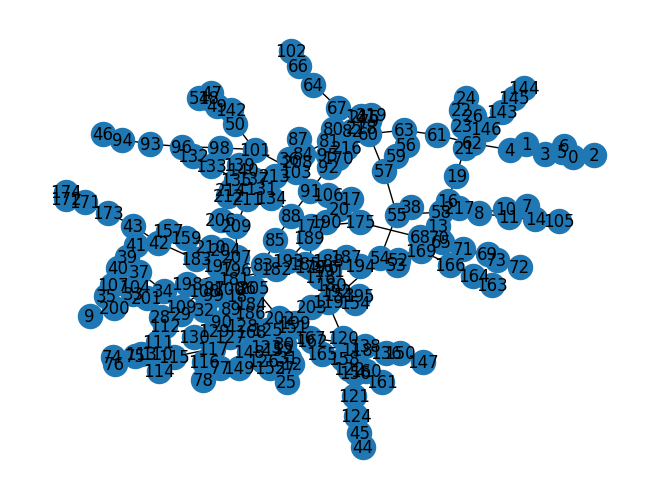

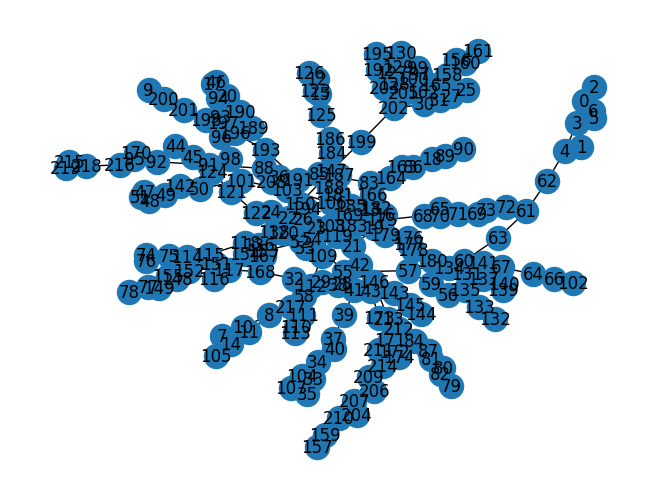

Nodes of the graph dataset: [0, 1, 3, 237, 135, 219, 2, 239, 4, 238, 187, 5, 226, 45, 206, 6, 137, 170, 181, 8, 41, 222, 7, 9, 10, 52, 194, 112, 79, 11, 12, 193, 13, 14, 201, 71, 15, 16, 152, 17, 218, 24, 18, 19, 216, 20, 21, 22, 26, 173, 103, 23, 73, 77, 32, 25, 94, 27, 28, 165, 86, 29, 234, 30, 105, 99, 31, 36, 149, 209, 121, 33, 34, 203, 111, 35, 49, 37, 217, 228, 38, 39, 108, 129, 40, 75, 197, 42, 140, 104, 43, 44, 179, 48, 46, 236, 47, 110, 174, 138, 155, 128, 50, 51, 120, 200, 53, 67, 125, 54, 55, 56, 57, 141, 158, 198, 58, 59, 223, 60, 61, 233, 167, 62, 185, 188, 127, 63, 64, 65, 113, 66, 68, 69, 136, 70, 166, 211, 186, 72, 126, 74, 172, 76, 107, 182, 78, 80, 81, 87, 117, 109, 82, 195, 83, 84, 85, 151, 178, 88, 96, 97, 90, 89, 91, 93, 92, 95, 159, 235, 145, 98, 202, 192, 100, 102, 101, 106, 224, 132, 221, 205, 114, 115, 116, 139, 118, 154, 119, 183, 143, 189, 212, 225, 122, 124, 148, 176, 123, 142, 184, 230, 214, 130, 131, 169, 133, 191, 227, 134, 177, 144, 146, 147, 150, 153, 1

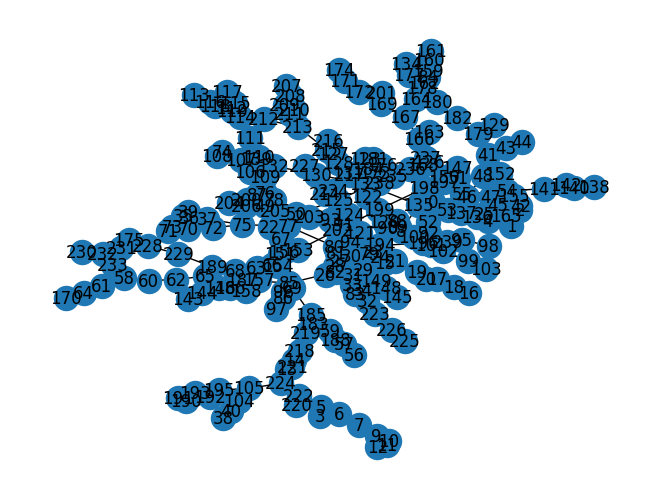

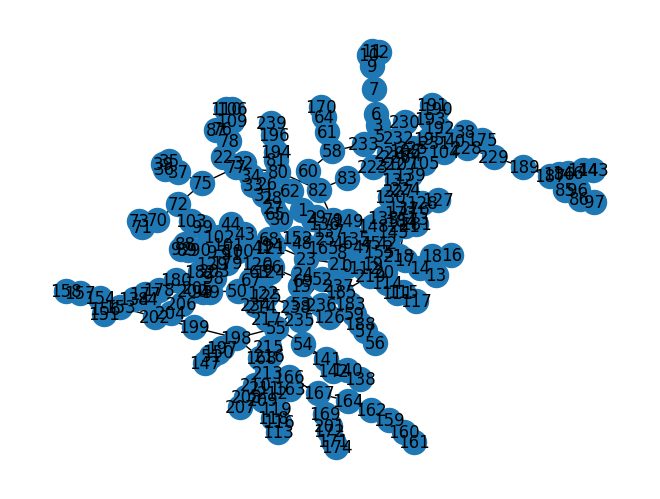

Nodes of the graph dataset: [0, 1, 259, 258, 3, 257, 9, 140, 110, 2, 117, 248, 148, 115, 14, 214, 91, 185, 4, 5, 212, 76, 6, 106, 198, 50, 8, 113, 223, 156, 201, 123, 207, 17, 81, 7, 10, 93, 137, 11, 12, 237, 13, 100, 146, 108, 15, 16, 75, 28, 236, 18, 19, 255, 166, 251, 21, 138, 186, 22, 167, 20, 79, 192, 215, 24, 183, 175, 23, 25, 70, 26, 133, 27, 124, 189, 29, 194, 30, 151, 196, 90, 31, 32, 33, 34, 35, 120, 36, 97, 37, 38, 55, 244, 210, 163, 68, 69, 39, 40, 41, 71, 56, 154, 58, 134, 197, 42, 43, 61, 102, 72, 44, 45, 233, 83, 46, 47, 229, 225, 48, 49, 89, 51, 243, 241, 73, 125, 52, 53, 54, 153, 57, 131, 164, 136, 169, 59, 60, 147, 62, 63, 130, 64, 65, 139, 143, 66, 101, 67, 246, 109, 112, 150, 144, 118, 74, 77, 78, 208, 80, 211, 132, 242, 82, 84, 85, 86, 87, 128, 149, 155, 88, 145, 92, 94, 95, 96, 206, 253, 98, 99, 222, 232, 158, 104, 135, 103, 105, 252, 107, 218, 111, 176, 114, 224, 116, 173, 193, 235, 119, 228, 213, 121, 122, 191, 165, 209, 126, 127, 249, 142, 129, 174, 202, 256, 1

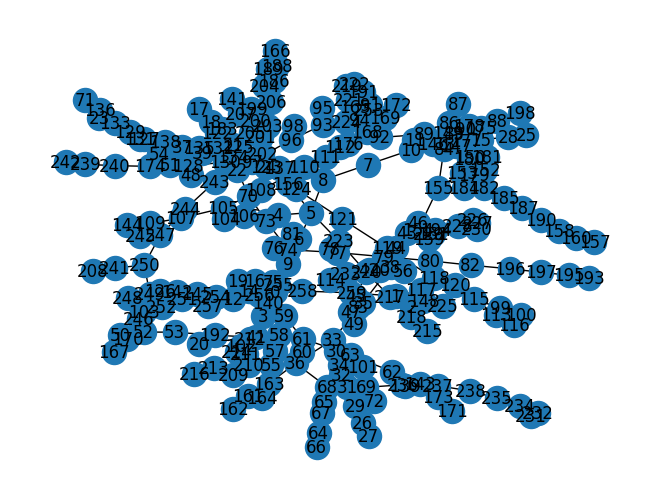

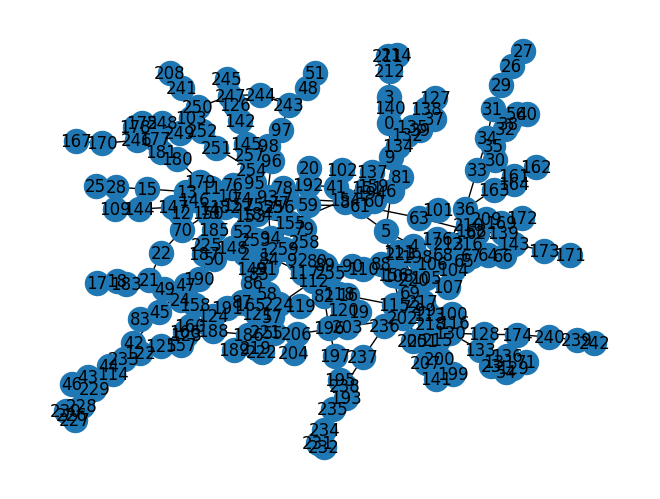

Nodes of the graph dataset: [0, 1, 2, 278, 3, 277, 246, 279, 4, 55, 6, 16, 164, 169, 195, 5, 7, 219, 157, 149, 182, 172, 220, 8, 10, 92, 9, 11, 273, 12, 215, 62, 119, 124, 13, 14, 197, 15, 71, 230, 39, 17, 232, 18, 123, 165, 224, 95, 20, 44, 213, 19, 21, 22, 47, 49, 23, 125, 186, 24, 25, 104, 26, 60, 27, 85, 127, 56, 257, 88, 28, 29, 70, 83, 30, 37, 31, 201, 32, 226, 135, 259, 33, 34, 35, 36, 38, 69, 209, 212, 41, 181, 242, 258, 40, 42, 43, 251, 231, 185, 154, 65, 248, 152, 89, 45, 46, 270, 133, 150, 48, 180, 126, 50, 109, 98, 193, 52, 51, 53, 54, 170, 274, 275, 214, 176, 128, 57, 58, 179, 90, 79, 59, 117, 264, 153, 236, 140, 61, 175, 203, 63, 183, 67, 64, 66, 243, 68, 91, 114, 211, 72, 174, 73, 238, 87, 74, 75, 76, 77, 112, 78, 237, 272, 204, 80, 81, 82, 86, 158, 221, 84, 247, 107, 210, 262, 235, 156, 145, 260, 93, 94, 110, 121, 96, 97, 177, 188, 99, 265, 250, 108, 100, 118, 208, 101, 268, 192, 102, 103, 105, 106, 261, 202, 138, 120, 111, 113, 269, 223, 116, 255, 271, 115, 143, 122, 2

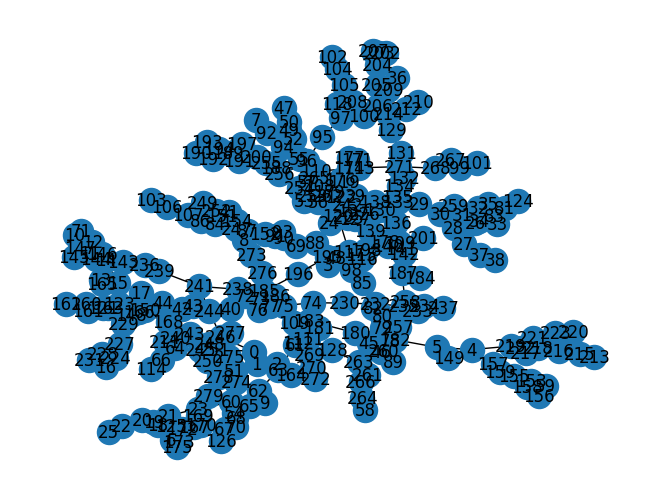

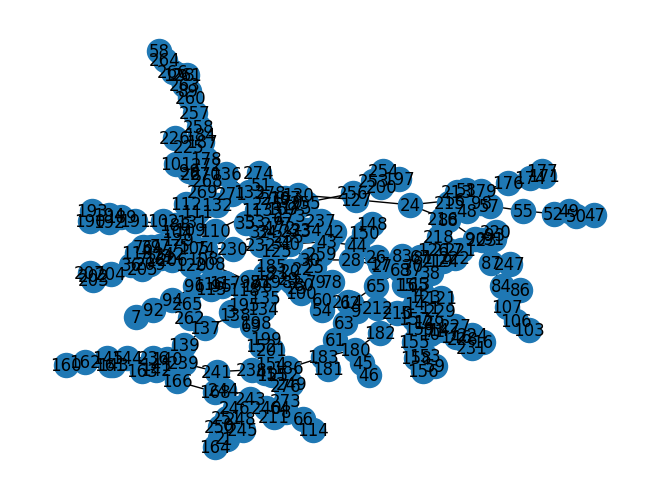

Nodes of the graph dataset: [0, 1, 299, 298, 3, 297, 211, 232, 2, 4, 101, 62, 191, 6, 208, 219, 5, 7, 8, 13, 78, 9, 278, 237, 40, 281, 10, 11, 12, 35, 76, 18, 158, 104, 154, 14, 133, 251, 155, 15, 260, 16, 17, 256, 75, 130, 19, 290, 245, 21, 24, 20, 22, 137, 181, 275, 147, 184, 124, 136, 23, 220, 25, 26, 27, 28, 259, 43, 77, 29, 31, 189, 41, 167, 30, 32, 33, 34, 36, 123, 118, 276, 119, 48, 146, 200, 93, 37, 38, 39, 57, 172, 152, 240, 98, 162, 42, 105, 134, 51, 222, 254, 45, 157, 102, 44, 46, 145, 113, 68, 153, 47, 91, 87, 49, 214, 203, 226, 50, 52, 144, 53, 94, 54, 55, 268, 56, 149, 180, 84, 107, 174, 58, 59, 103, 71, 60, 61, 269, 63, 204, 282, 183, 72, 65, 64, 66, 182, 294, 67, 69, 97, 70, 166, 271, 106, 150, 156, 73, 252, 74, 115, 198, 79, 108, 80, 109, 81, 82, 83, 88, 85, 273, 169, 236, 231, 195, 86, 89, 206, 274, 90, 263, 190, 92, 246, 291, 179, 243, 95, 284, 96, 99, 122, 258, 111, 129, 151, 100, 202, 128, 283, 249, 110, 112, 210, 138, 244, 114, 279, 116, 117, 264, 120, 121, 192, 2

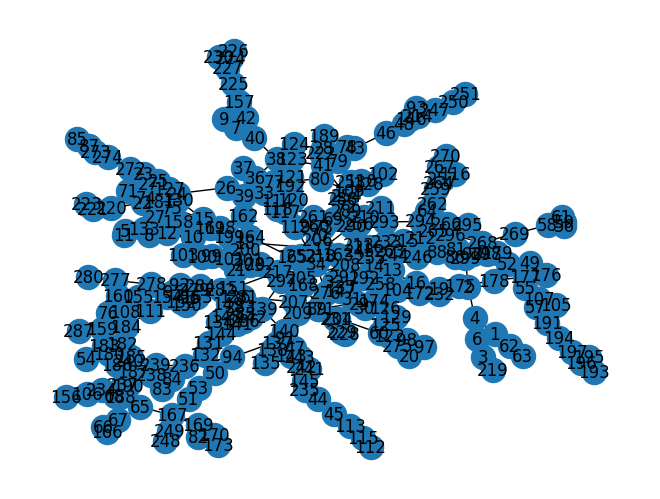

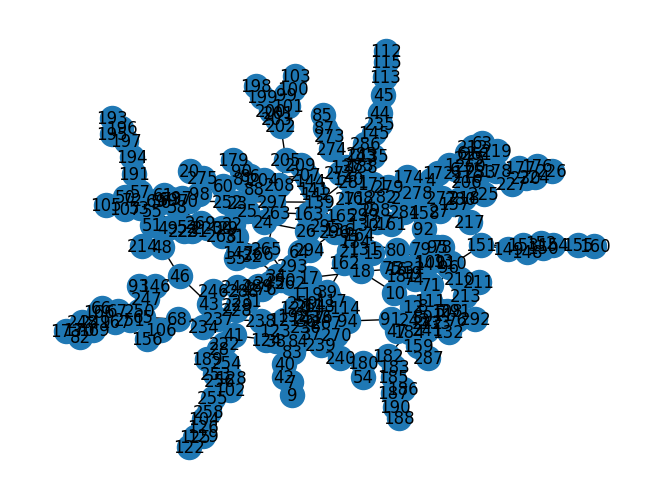

Nodes of the graph dataset: [0, 1, 2, 318, 3, 317, 178, 319, 307, 78, 4, 120, 42, 5, 6, 7, 8, 9, 208, 293, 10, 231, 213, 165, 220, 89, 12, 79, 58, 13, 175, 291, 11, 14, 68, 15, 72, 234, 16, 115, 185, 17, 177, 18, 83, 19, 117, 161, 125, 20, 21, 63, 22, 206, 23, 67, 24, 211, 38, 139, 25, 45, 167, 94, 26, 27, 28, 29, 236, 286, 30, 131, 272, 31, 74, 32, 268, 205, 33, 102, 34, 35, 182, 36, 100, 233, 37, 295, 297, 59, 311, 57, 162, 257, 188, 207, 39, 41, 103, 112, 251, 266, 40, 43, 82, 150, 44, 253, 219, 256, 62, 50, 144, 46, 47, 81, 108, 48, 154, 53, 198, 49, 247, 232, 179, 52, 105, 51, 168, 54, 244, 55, 140, 303, 56, 148, 176, 289, 145, 87, 132, 60, 227, 61, 64, 65, 92, 136, 66, 183, 69, 200, 70, 242, 71, 73, 75, 222, 249, 254, 226, 76, 135, 260, 275, 77, 202, 90, 93, 127, 246, 153, 80, 196, 305, 95, 110, 84, 111, 85, 86, 173, 88, 91, 186, 113, 142, 96, 97, 277, 98, 99, 172, 238, 278, 101, 217, 137, 104, 106, 215, 149, 107, 270, 109, 190, 155, 122, 192, 267, 114, 116, 118, 119, 121, 237, 1

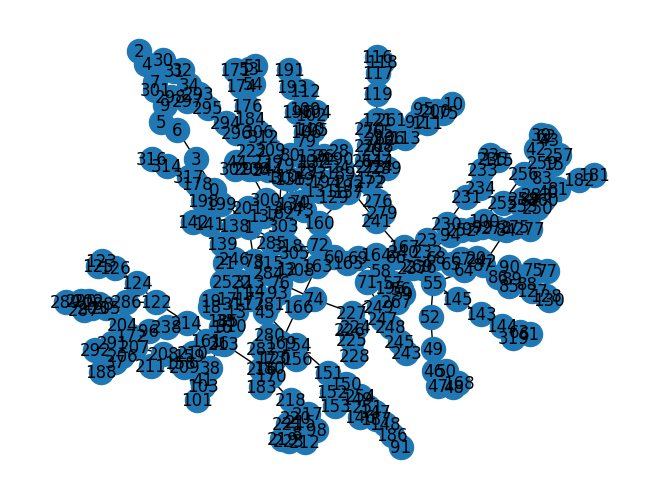

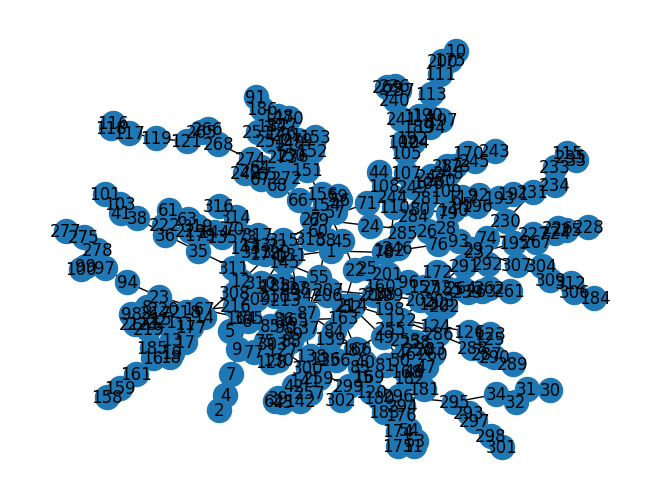

Nodes of the graph dataset: [0, 1, 339, 2, 338, 3, 337, 154, 4, 5, 6, 158, 248, 180, 7, 8, 312, 283, 9, 10, 11, 153, 12, 276, 13, 14, 336, 15, 16, 129, 207, 17, 99, 321, 251, 18, 230, 19, 20, 185, 179, 21, 322, 107, 301, 62, 23, 25, 290, 22, 24, 215, 295, 125, 212, 118, 231, 293, 26, 72, 27, 317, 28, 61, 29, 164, 30, 274, 58, 211, 128, 31, 32, 197, 33, 235, 34, 319, 35, 225, 36, 227, 70, 38, 150, 39, 220, 133, 37, 40, 242, 41, 159, 244, 42, 320, 281, 119, 43, 136, 44, 45, 167, 46, 280, 67, 47, 48, 85, 49, 59, 275, 297, 50, 51, 52, 53, 93, 55, 56, 236, 97, 54, 57, 203, 213, 193, 282, 106, 218, 60, 327, 253, 330, 289, 63, 64, 110, 199, 318, 210, 65, 334, 66, 79, 141, 209, 222, 333, 68, 69, 131, 81, 104, 71, 73, 173, 325, 74, 262, 75, 76, 174, 285, 77, 78, 183, 80, 186, 201, 82, 90, 271, 229, 83, 84, 86, 87, 181, 88, 91, 161, 89, 137, 92, 94, 96, 95, 98, 100, 234, 101, 102, 140, 103, 249, 148, 105, 126, 108, 135, 243, 109, 191, 111, 146, 113, 217, 258, 112, 114, 115, 284, 116, 117, 223, 2

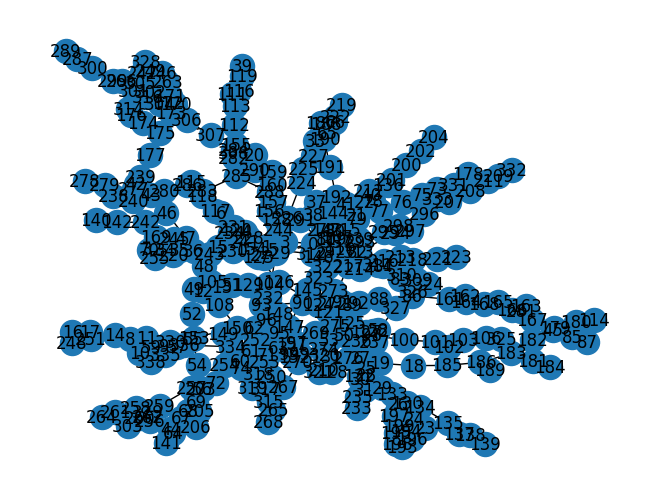

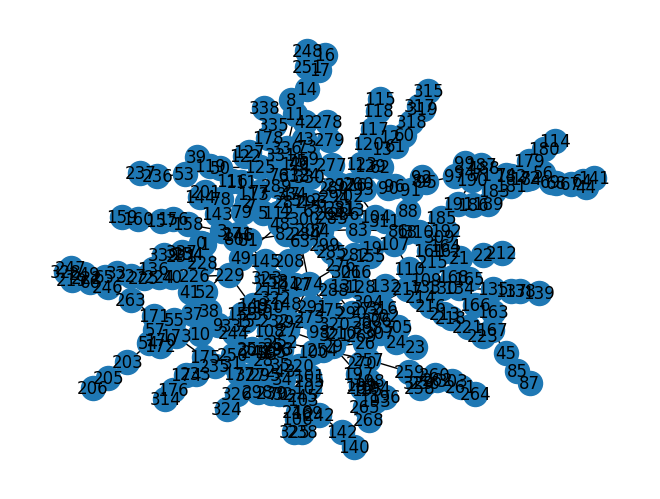

Nodes of the graph dataset: [0, 1, 2, 3, 357, 261, 359, 4, 358, 80, 64, 230, 299, 281, 190, 197, 5, 53, 60, 6, 7, 184, 228, 8, 9, 329, 165, 10, 324, 11, 71, 12, 181, 221, 263, 349, 202, 14, 351, 346, 13, 15, 94, 142, 16, 321, 59, 149, 278, 17, 169, 18, 19, 20, 21, 231, 22, 23, 78, 339, 222, 24, 25, 344, 26, 27, 66, 28, 125, 260, 40, 29, 30, 132, 313, 320, 31, 126, 32, 253, 92, 33, 209, 34, 35, 223, 43, 37, 38, 89, 73, 290, 36, 39, 200, 41, 131, 44, 291, 121, 341, 42, 297, 198, 45, 102, 353, 259, 213, 283, 322, 46, 47, 48, 179, 49, 74, 201, 139, 288, 50, 51, 52, 54, 144, 55, 56, 243, 328, 57, 58, 317, 67, 308, 147, 62, 143, 345, 104, 318, 315, 61, 63, 65, 117, 178, 270, 68, 123, 69, 96, 310, 203, 70, 252, 72, 75, 316, 76, 77, 337, 276, 79, 218, 135, 233, 82, 285, 81, 83, 286, 84, 85, 105, 127, 87, 271, 86, 88, 90, 262, 91, 196, 93, 207, 194, 95, 157, 97, 98, 99, 216, 100, 101, 103, 212, 171, 106, 237, 108, 107, 109, 334, 110, 300, 111, 145, 112, 113, 114, 265, 115, 116, 122, 118, 323, 1

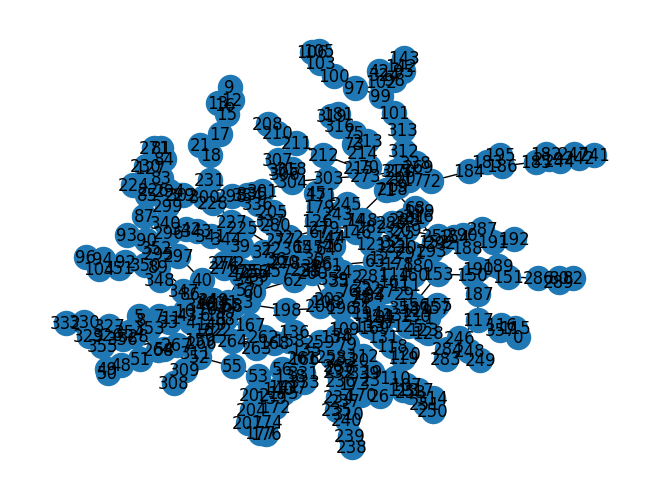

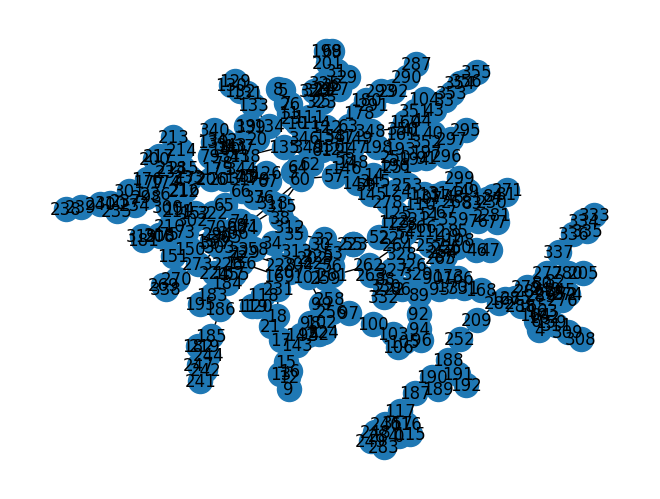

Nodes of the graph dataset: [0, 1, 2, 377, 16, 3, 379, 4, 378, 34, 5, 149, 182, 255, 200, 227, 290, 6, 228, 179, 7, 28, 260, 375, 8, 9, 229, 10, 186, 11, 63, 169, 12, 332, 269, 118, 197, 294, 14, 362, 274, 13, 15, 161, 44, 343, 370, 194, 24, 17, 18, 349, 353, 225, 19, 314, 20, 21, 98, 115, 318, 163, 22, 23, 56, 373, 25, 158, 26, 81, 77, 27, 215, 29, 135, 97, 30, 345, 31, 113, 147, 79, 321, 366, 32, 220, 33, 114, 35, 214, 36, 37, 41, 136, 38, 39, 338, 40, 162, 256, 42, 43, 344, 221, 365, 123, 348, 45, 326, 46, 54, 47, 48, 191, 49, 50, 51, 181, 102, 60, 52, 165, 53, 83, 224, 137, 152, 101, 374, 330, 298, 55, 57, 58, 59, 206, 61, 277, 322, 306, 62, 64, 65, 354, 66, 278, 310, 212, 67, 68, 88, 134, 364, 96, 69, 70, 71, 154, 119, 78, 72, 73, 308, 74, 75, 317, 376, 76, 372, 296, 267, 324, 170, 160, 80, 90, 153, 82, 94, 231, 84, 331, 85, 86, 112, 168, 146, 87, 89, 275, 91, 295, 188, 195, 92, 93, 111, 261, 95, 336, 203, 132, 100, 174, 99, 103, 211, 104, 105, 106, 107, 108, 172, 109, 313, 110, 2

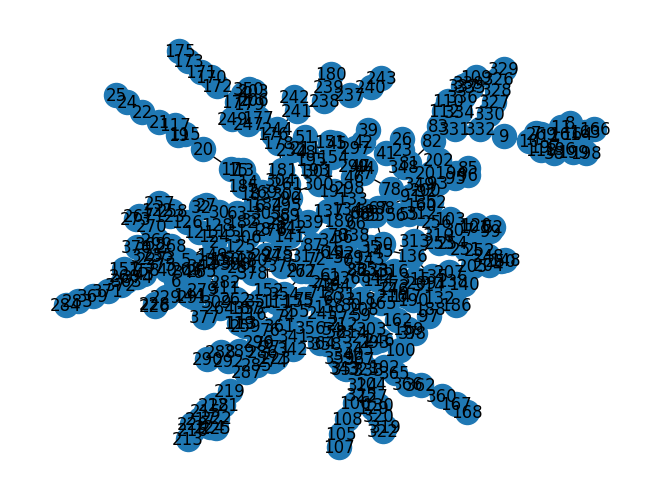

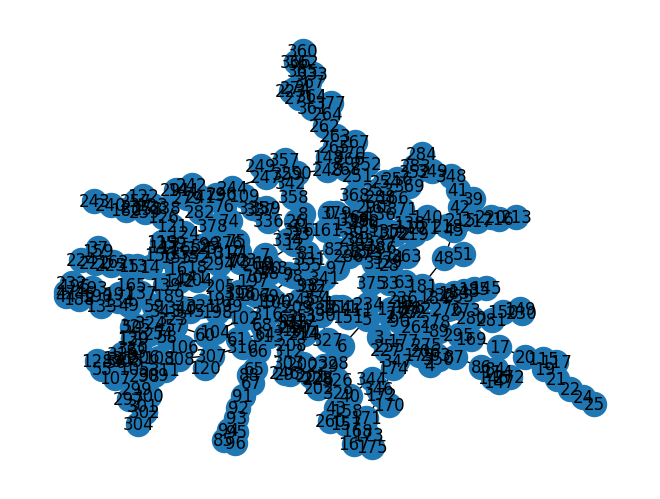

In [ ]:
#For Each set of nodes comparing time zones:
time_taken_analysis= []
# Read the graph data from the CSV file into a pandas DataFrame
for i in range (20, 400,20):
    filename = "graph_data_with_weights" + str(i) + ".csv"
    df = pd.read_csv(filename)

    # Create an empty graph
    G = nx.Graph()

    # Add nodes and edges with weights from the DataFrame
    for index, row in df.iterrows():
        source = row['Source']
        target = row['Target']
        weight_str = row['Weight']
        weight_dict = ast.literal_eval(weight_str)  # Convert string to dictionary
        weight = weight_dict['weight']  # Extract the weight value
        G.add_edge(source, target, weight=weight)

    # Print nodes and edges of the read graph
    print("Nodes of the graph dataset:",  G.nodes())
    print("Edges of the read graph:", G.edges(data=True))

    # Print the graph information
    print("Nodes:", G.nodes())
    print("Edges:", G.edges(data=True))

    # Calculate the MST using Prim's Algorithm
    start_time_prim = time.time()
    MST_prim = prims(G)
    end_time_prim = time.time()
    time_taken_prim = end_time_prim - start_time_prim

    # Calculate the MST using Kruskal's Algorithm
    start_time_kruskal = time.time()
    MST_kruskal = kruskal_mst(G)
    end_time_kruskal = time.time()
    time_taken_kruskal = end_time_kruskal - start_time_kruskal

    # Print the time taken for each algorithm
    print("Time taken for Prim's Algorithm:", time_taken_prim, "seconds")
    print("Time taken for Kruskal's Algorithm:", time_taken_kruskal, "seconds")

    # Save the efficiencies in a CSV file
    time_taken_analysis.append([i, time_taken_prim, time_taken_kruskal])

    # Display the MSTs (optional)
    nx.draw(MST_prim, with_labels=True)
    plt.show()

    nx.draw(MST_kruskal, with_labels=True)
    plt.show()

df = pd.DataFrame(time_taken_analysis,  columns=['Datasamples', 'Prims', 'Kruskal'])
filename = "Time_analysis.csv"
df.to_csv(filename, index=False)






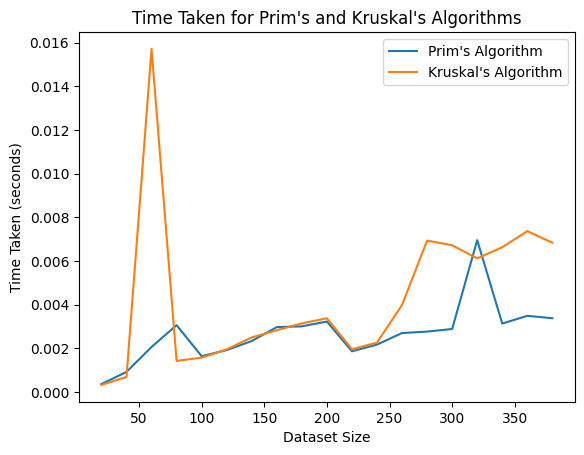

In [ ]:


# Plot the time taken for Prim's and Kruskal's algorithms
plt.plot(df['Datasamples'], df['Prims'], label="Prim's Algorithm")
plt.plot(df['Datasamples'], df['Kruskal'], label="Kruskal's Algorithm")
plt.xlabel('Dataset Size')
plt.ylabel('Time Taken (seconds)')
plt.title('Time Taken for Prim\'s and Kruskal\'s Algorithms')
plt.legend()
plt.show()